In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from datetime import datetime
from scipy import stats
import scipy.optimize

from os import listdir
from os.path import isfile, join

from MSsmoothing import smoothMS

rootfolder="/home/aulegoup/Optical_fibers/Absorption_spectra_experiments/"

# Extract all from folder

In [2]:
FILES=[
        {'NameFoldExtract':"2024-08-04 - Sample 1 TA cycling 270K 5uW",
        'NameSubFoldTemp':"Temperature data",
        'NameCSVforTemp':"2024-08-04 Sun 10h04min45s - fiber T curve - dur 23211s.csv",
        'firstfilenb':0,
        'samplelength':41.4, #m
        'sweepperiod':2.261}, #s #program SWEEPMID0
    
        {'NameFoldExtract':"2024-08-06 - Sample 1 TA slow 5uW",
        'NameSubFoldTemp':"Temperature data",
        'NameCSVforTemp':"2024-08-06 Tue 13h05min12s - fiber T curve - dur 80589s.csv",
        'firstfilenb':0,
        'samplelength':41.4, #m
        'sweepperiod':2.261}, #s #program SWEEPMID0
    
        {'NameFoldExtract':"2024-08-07 - Sample 1 TA slow 5uW 2",
        'NameSubFoldTemp':"Temperature data",
        'NameCSVforTemp':"2024-08-07 Wed 11h46min54s - fiber T curve - dur 104320s.csv",
        'firstfilenb':0,
        'samplelength':41.4, #m
        'sweepperiod':2.261}, #s #program SWEEPMID0

]


In [3]:
DIC_fprop={}

for idfiles,dicfile in enumerate(FILES) :
    #######################################################################################################
    #First, let's extract all the time information from the filenames.
    #######################################################################################################
    
    mypath=join(rootfolder,dicfile["NameFoldExtract"])
    LISTFILES = sorted([f for f in listdir(mypath) if isfile(join(mypath, f))])[dicfile['firstfilenb']:]
    Nfiles=len(LISTFILES)
    
    #List file properties
    DIC_fprop[idfiles]={
        "Name2Id":{},
        "Id2Name":{},
        "Id2Datetime":{},
        "Id2WL":{},
        "Id2LEVEL":{}
    }
    for i,f in enumerate(LISTFILES):
        DATE=f.split('_')[0].split('W')[1]
        YY=DATE[:4]
        MM=DATE[4:6]
        DD=DATE[6:8]
        H=f.split('.')[0].split('_')[1][:2]
        M=f.split('.')[0].split('_')[1][2:4]
        S=f.split('.')[0].split('_')[1][4:6]
        ISOTIME=f"{YY}-{MM}-{DD}T{H}:{M}:{S}-05:00"
        DIC_fprop[idfiles]["Name2Id"][f]=i
        DIC_fprop[idfiles]["Id2Name"][i]=f
        DIC_fprop[idfiles]["Id2Datetime"][i]=datetime.fromisoformat(ISOTIME)
        if i==0:
            print(DIC_fprop[idfiles])
    
    
    #######################################################################################################
    #Now, let's extract the spectra from the files:
    #######################################################################################################
    
    for i in range(Nfiles):
        with open(join(mypath,DIC_fprop[idfiles]["Id2Name"][i]),'r') as f:
                LINES=f.readlines()
                N=len(LINES)
                n=0
                while "[TRACE DATA]" not in LINES[n]:
                    n+=1
                WL_nm,LEVEL_dBm=[],[]
                for j in range(n+1,N):
                    l=LINES[j]
                    if '.' in l:
                        wl=float((l.split(','))[0])
                        lvl=float((l.split(','))[1])
                        if wl>=600 and wl<=1700:
                            WL_nm+=[wl]
                            LEVEL_dBm+=[lvl]
        if i==0:
            WL_nm0=WL_nm
        elif WL_nm0!=WL_nm:
            raise NameError(f"WL difference at id {i}")
        DIC_fprop[idfiles]["Id2LEVEL"][i]=np.array(LEVEL_dBm)
    
    DIC_fprop[idfiles]["WL_nm"]=np.array(WL_nm)


def add_subplot_axes(ax,rect,axisbg='w'):
    #https://stackoverflow.com/questions/17458580/embedding-small-plots-inside-subplots-in-matplotlib
    fig = plt.gcf()
    box = ax.get_position()
    width = box.width
    height = box.height
    inax_position  = ax.transAxes.transform(rect[0:2])
    transFigure = fig.transFigure.inverted()
    infig_position = transFigure.transform(inax_position)    
    x = infig_position[0]
    y = infig_position[1]
    width *= rect[2]
    height *= rect[3]  # <= Typo was here
    subax = fig.add_axes([x,y,width,height])#,facecolor=facecolor)  # matplotlib 2.0+
    #subax = fig.add_axes([x,y,width,height],axisbg=axisbg)
    x_labelsize = subax.get_xticklabels()[0].get_size()
    y_labelsize = subax.get_yticklabels()[0].get_size()
    x_labelsize *= rect[2]**0.5
    y_labelsize *= rect[3]**0.5
    subax.xaxis.set_tick_params(labelsize=x_labelsize)
    subax.yaxis.set_tick_params(labelsize=y_labelsize)
    return subax


{'Name2Id': {'W20240804_100759.CSV': 0}, 'Id2Name': {0: 'W20240804_100759.CSV'}, 'Id2Datetime': {0: datetime.datetime(2024, 8, 4, 10, 7, 59, tzinfo=datetime.timezone(datetime.timedelta(days=-1, seconds=68400)))}, 'Id2WL': {}, 'Id2LEVEL': {}}
{'Name2Id': {'W20240806_130828.CSV': 0}, 'Id2Name': {0: 'W20240806_130828.CSV'}, 'Id2Datetime': {0: datetime.datetime(2024, 8, 6, 13, 8, 28, tzinfo=datetime.timezone(datetime.timedelta(days=-1, seconds=68400)))}, 'Id2WL': {}, 'Id2LEVEL': {}}
{'Name2Id': {'W20240807_115012.CSV': 0}, 'Id2Name': {0: 'W20240807_115012.CSV'}, 'Id2Datetime': {0: datetime.datetime(2024, 8, 7, 11, 50, 12, tzinfo=datetime.timezone(datetime.timedelta(days=-1, seconds=68400)))}, 'Id2WL': {}, 'Id2LEVEL': {}}


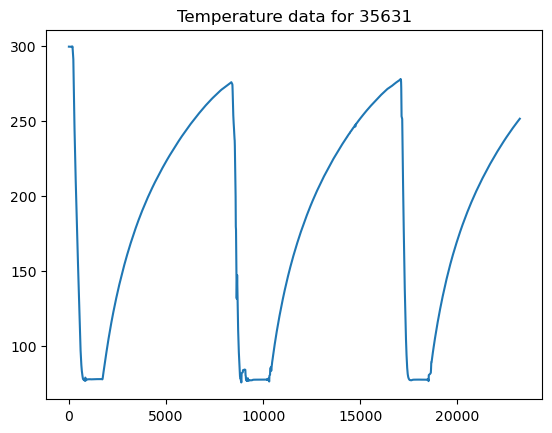

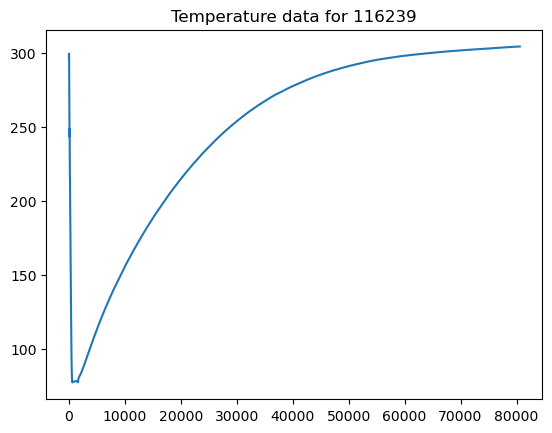

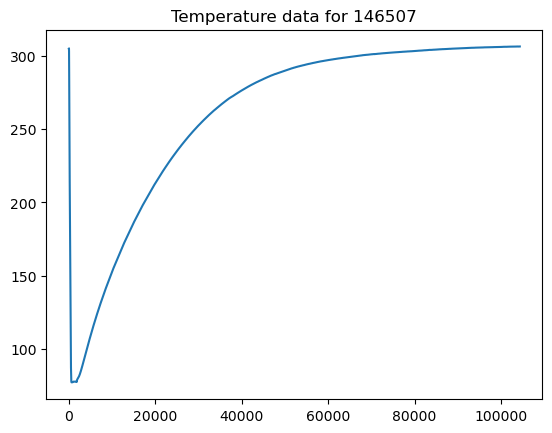

In [4]:
#######################################################################################################
#Let's extract the temperature data:
#######################################################################################################
TEMPFILES=[]
for j,dicfile in enumerate(FILES):
    mypath=join(rootfolder,dicfile["NameFoldExtract"])
    Tpath=join(join(mypath,dicfile['NameSubFoldTemp']),dicfile['NameCSVforTemp'])
    with open(Tpath,'r') as f:
        LINES_T=f.readlines()
        N_T=len(LINES_T)
        TIME_T,TEMP=[],[]
        for i in range(N_T):
            l=LINES_T[i]
            if '.' in l:
                sec,temp=float((l.split(','))[0]),float((l.split(','))[1])
                if temp>75 and (i==0 or np.abs(temp-TEMP[-1])<35):
                    TIME_T+=[sec]
                    TEMP+=[temp]
    TEMP = smoothMS(TEMP,n=6,m=200)
    plt.plot(TIME_T,TEMP)
    plt.title(f"Temperature data for {i}")
    plt.show()
    TEMPFILES+=[{
        "TIME_T":np.array(TIME_T),
        "TEMP":np.array(TEMP),
    }]
    
def TimetoTemp(t,idfile,mode="id"):
    if mode=="id":
        return next(x for x,sec in enumerate(TEMPFILES[idfile]["TIME_T"]) if sec>t)
    elif mode=="temp":
        return np.interp(t,TEMPFILES[idfile]["TIME_T"], TEMPFILES[idfile]["TEMP"])

W20240804_100759.CSV
9926
1545.6
W20240804_102155.CSV
9926
1545.6
W20240804_124454.CSV
9926
1545.6
W20240804_150156.CSV
9926
1545.6
W20240804_161506.CSV
9926
1545.6
W20240804_163448.CSV
9926
1545.6
W20240806_131924.CSV
21818
600.0
W20240807_120508.CSV
21816
1543.6


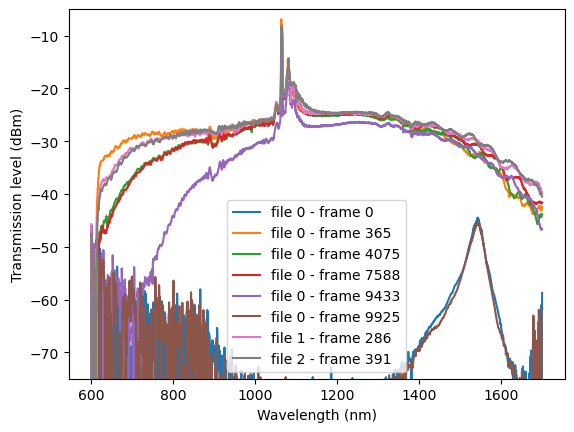

In [5]:
  
fig, ax = plt.subplots()


FILEID=6*[0]+[1,2]
# idtest=4532
for i,idtest in enumerate([0,365,4075,7588,9433,9925]+[286,391]):
    fileid=FILEID[i]
    print(DIC_fprop[fileid]["Id2Name"][idtest])
    
    print(len( DIC_fprop[fileid]["Id2LEVEL"]))
    print(WL_nm[np.argmax(DIC_fprop[fileid]["Id2LEVEL"][364])])
    
    # fig, ax = plt.subplots()
    
    ax.plot(WL_nm, DIC_fprop[fileid]["Id2LEVEL"][idtest],label=f"file {fileid} - frame {idtest}")
    ax.set_xlabel("Wavelength (nm)")
    ax.set_ylabel("Transmission level (dBm)")
    ax.set_ylim(-75, -5)
    # plt.xlim(1550-10,1550+10)
ax.legend()
plt.show()

W20240804_102155.CSV
9926
1545.6
W20240804_124454.CSV
9926
1545.6
W20240804_150156.CSV
9926
1545.6
W20240806_131924.CSV
21818
600.0
W20240807_120508.CSV
21816
1543.6


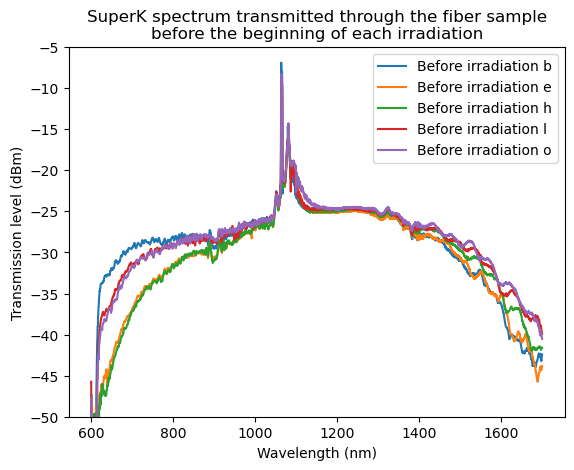

In [25]:
  
fig, ax = plt.subplots()


ListIDLabelsFile=[
    (365, "Before irradiation b", 0),
    (4075, "Before irradiation e", 0),
    (7588, "Before irradiation h", 0),
    (286, "Before irradiation l", 1),
    (391, "Before irradiation o", 2)
]

IDlist = [t[0] for t in ListIDLabelsFile]
Labellist = [t[1] for t in ListIDLabelsFile]
FILEID = [t[2] for t in ListIDLabelsFile]

for i,idtest in enumerate(IDlist):
    fileid=FILEID[i]
    print(DIC_fprop[fileid]["Id2Name"][idtest])
    
    print(len( DIC_fprop[fileid]["Id2LEVEL"]))
    print(WL_nm[np.argmax(DIC_fprop[fileid]["Id2LEVEL"][364])])
    
    # fig, ax = plt.subplots()
    
    ax.plot(WL_nm, DIC_fprop[fileid]["Id2LEVEL"][idtest],label=Labellist[i])
    ax.set_xlabel("Wavelength (nm)")
    ax.set_ylabel("Transmission level (dBm)")
    ax.set_ylim(-75, -5)
    # plt.xlim(1550-10,1550+10)
ax.legend()
ax.set_ylim(bottom=-50)
ax.set_title("SuperK spectrum transmitted through the fiber sample\nbefore the beginning of each irradiation")
plt.savefig("WLbeforeirradTAkin.pdf",bbox_inches="tight")
plt.show()

# RIA at fixed wl versus time

In [7]:
ID_except= [365,4075,7588,9433]#+list(range(0,4000))+list(range(4500,10000))

fileid = 0
starttime = 0#840 #s
i_start = 0#366
i_end = 9925

TIME = np.arange(i_end-i_start) * FILES[fileid]['sweepperiod']/60

TimeCorrectionForZeroingTimes = (17640-840)/(7588-365) / FILES[fileid]['sweepperiod']
print(f"Time correction ratio for zeroing times : {TimeCorrectionForZeroingTimes:.4f} (no unit)")
TIME *= TimeCorrectionForZeroingTimes

RIA_avgrange = (1550-10,1550+10)
ID_avgrange = ( next(x for x, val in enumerate(WL_nm) if val >= RIA_avgrange[0]),  next(x for x, val in enumerate(WL_nm) if val >= RIA_avgrange[1]) )
# print(ID_avgrange)

#RIA in dB/km
mean_RIA = np.array([np.mean( ( DIC_fprop[fileid]["Id2LEVEL"][i_start][ID_avgrange[0]:ID_avgrange[1]+1]
                              - DIC_fprop[fileid]["Id2LEVEL"][i][ID_avgrange[0]:ID_avgrange[1]+1]       ) / FILES[fileid]['samplelength'] * 1000) for i in range(i_start,i_end)])

MASKPLOT=np.array([(i+i_start not in ID_except) for i in range(i_end-i_start)])

aspectratio=3.
fig, ax1 = plt.subplots(figsize=[aspectratio*4.8, 4.8])
ax1.plot(TIME[MASKPLOT],mean_RIA[MASKPLOT])
ax1.set_xlabel("Time (min)")
ax1.set_ylabel("RIA (dB/km)")
ax1.set_xlim(right=TIME[-1]+10)
ax1.set_ylim(-20)
for i in ID_except[:-1]:
    ax1.axvline(x=TIME[i+1-i_start],color="orange",linestyle="dashed",label="start irradiation" if i==ID_except[0] else "")
    print("End irrad id :", i_start + next(x for x,t in enumerate(TIME) if t>TIME[i+1-i_start]+14))
    ax1.axvline(x=TIME[i+1-i_start]+14,color="brown",linestyle="dashed",label="end irradiation" if i==ID_except[0] else "")

mean_RIA_0 = np.mean( ( DIC_fprop[fileid]["Id2LEVEL"][i_start][ID_avgrange[0]:ID_avgrange[1]+1]
                    - DIC_fprop[fileid]["Id2LEVEL"][ID_except[0]+1][ID_avgrange[0]:ID_avgrange[1]+1] ) / FILES[fileid]['samplelength'] * 1000)
ax1.plot(TIME[MASKPLOT],mean_RIA_0*np.ones_like(TIME[MASKPLOT]), label=f"RIA level at beginning at {TIME[ID_except[0]+1]:.1f} min",
        linewidth=0.5,color='k')

ax1.legend()

ax2 = ax1.twinx()
colorTemp = 'darkgreen'
ax2.set_ylabel("Temperature (K)",color=colorTemp)
ax2.plot((TEMPFILES[fileid]["TIME_T"]-starttime)/60,TEMPFILES[fileid]["TEMP"],color=colorTemp,linestyle="dotted")
ax2.tick_params(axis='y', labelcolor=colorTemp)

cursorposition = 14 #min
# ax2.axvline(cursorposition,label="cursor",linewidth=0.5,color="k")
print("RIA ID", next(x for x,t in enumerate(TIME) if t>cursorposition))
print(f"Temperature at cursor position ({cursorposition*60:.2f}) : {TimetoTemp(cursorposition*60+starttime,fileid,mode="temp")} K")
# ax2.legend()

plt.title("RIA around 1550nm probed with 1550nm laser at 5uW")
fig.set_dpi(1000)
# plt.show()
plt.savefig("TAkinExp-timeplot-1.pdf")

# plt.plot(TIME[(TIME>40) * (TIME<50)],mean_RIA[(TIME>40) * (TIME<50)])
# plt.xlabel("Time (min)")
# plt.ylabel("RIA (dB/km)")
# plt.show()

Time correction ratio for zeroing times : 1.0287 (no unit)
End irrad id : 728
End irrad id : 4438
End irrad id : 7951
RIA ID 362
Temperature at cursor position (840.00) : 78.56541321791703 K


In [8]:
ID_except= [286]#+list(range(0,4000))+list(range(4500,10000))

fileid = 1
starttime = 0#840 #s
i_start = 0#366
i_end = 21818

TIME = np.arange(i_end-i_start) * FILES[fileid]['sweepperiod']/60

TimeCorrectionForZeroingTimes = (17640-840)/(7588-365) / FILES[fileid]['sweepperiod']
print(f"Time correction ratio for zeroing times : {TimeCorrectionForZeroingTimes:.4f} (no unit)")
TIME *= TimeCorrectionForZeroingTimes

RIA_avgrange = (1550-10,1550+10)
ID_avgrange = ( next(x for x, val in enumerate(WL_nm) if val >= RIA_avgrange[0]),  next(x for x, val in enumerate(WL_nm) if val >= RIA_avgrange[1]) )
# print(ID_avgrange)

#RIA in dB/km
mean_RIA = np.array([np.mean( ( DIC_fprop[fileid]["Id2LEVEL"][i_start][ID_avgrange[0]:ID_avgrange[1]+1]
                              - DIC_fprop[fileid]["Id2LEVEL"][i][ID_avgrange[0]:ID_avgrange[1]+1]       ) / FILES[fileid]['samplelength'] * 1000) for i in range(i_start,i_end)])

MASKPLOT=np.array([(i+i_start not in ID_except) for i in range(i_end-i_start)])

aspectratio=3.
fig, ax1 = plt.subplots(figsize=[aspectratio*4.8, 4.8])
ax1.plot(TIME[MASKPLOT],mean_RIA[MASKPLOT])
ax1.set_xlabel("Time (min)")
ax1.set_ylabel("RIA (dB/km)")
ax1.set_xlim(right=TIME[-1]+10)
ax1.set_ylim(-20)
for i in ID_except[:]:
    ax1.axvline(x=TIME[i+1-i_start],color="orange",linestyle="dashed",label="start irradiation" if i==ID_except[0] else "")
    print("End irrad id :", i_start + next(x for x,t in enumerate(TIME) if t>TIME[i+1-i_start]+14))
    ax1.axvline(x=TIME[i+1-i_start]+14,color="brown",linestyle="dashed",label="end irradiation" if i==ID_except[0] else "")

mean_RIA_0 = np.mean( ( DIC_fprop[fileid]["Id2LEVEL"][i_start][ID_avgrange[0]:ID_avgrange[1]+1]
                    - DIC_fprop[fileid]["Id2LEVEL"][ID_except[0]+1][ID_avgrange[0]:ID_avgrange[1]+1] ) / FILES[fileid]['samplelength'] * 1000)
ax1.plot(TIME[MASKPLOT],mean_RIA_0*np.ones_like(TIME[MASKPLOT]), label=f"RIA level at beginning at {TIME[ID_except[0]+1]:.1f} min",
        linewidth=0.5,color='k')
ax1.legend()

ax2 = ax1.twinx()
colorTemp = 'darkgreen'
ax2.set_ylabel("Temperature (K)",color=colorTemp)
ax2.plot((TEMPFILES[fileid]["TIME_T"]-starttime)/60,TEMPFILES[fileid]["TEMP"],color=colorTemp,linestyle="dotted")
ax2.tick_params(axis='y', labelcolor=colorTemp)

cursorposition = 585 #min
# ax2.axvline(cursorposition,label="cursor",linewidth=0.5,color="k")
print("RIA ID", next(x for x,t in enumerate(TIME) if t>cursorposition))
print(f"Temperature at cursor position ({cursorposition*60:.2f}) : {TimetoTemp(cursorposition*60+starttime,fileid,mode="temp")} K")
# ax2.legend()

plt.title("RIA around 1550nm probed with 1550nm laser at 5uW")
fig.set_dpi(1000)
# plt.show()
plt.savefig("TAkinExp-timeplot-2.pdf")

# plt.plot(TIME[(TIME>40) * (TIME<50)],mean_RIA[(TIME>40) * (TIME<50)])
# plt.xlabel("Time (min)")
# plt.ylabel("RIA (dB/km)")
# plt.show()

Time correction ratio for zeroing times : 1.0287 (no unit)
End irrad id : 649
RIA ID 15091
Temperature at cursor position (35100.00) : 267.7702697384454 K


In [9]:
ID_except= [391]#+list(range(0,4000))+list(range(4500,10000))

fileid = 2
starttime = 0#840 #s
i_start = 0#366
i_end = 21816

TIME = np.arange(i_end-i_start) * FILES[fileid]['sweepperiod']/60

TimeCorrectionForZeroingTimes = (17640-840)/(7588-365) / FILES[fileid]['sweepperiod']
print(f"Time correction ratio for zeroing times : {TimeCorrectionForZeroingTimes:.4f} (no unit)")
TIME *= TimeCorrectionForZeroingTimes

RIA_avgrange = (1550-10,1550+10)
ID_avgrange = ( next(x for x, val in enumerate(WL_nm) if val >= RIA_avgrange[0]),  next(x for x, val in enumerate(WL_nm) if val >= RIA_avgrange[1]) )
# print(ID_avgrange)

#RIA in dB/km
mean_RIA = np.array([np.mean( ( DIC_fprop[fileid]["Id2LEVEL"][i_start][ID_avgrange[0]:ID_avgrange[1]+1]
                              - DIC_fprop[fileid]["Id2LEVEL"][i][ID_avgrange[0]:ID_avgrange[1]+1]       ) / FILES[fileid]['samplelength'] * 1000) for i in range(i_start,i_end)])

MASKPLOT=np.array([(i+i_start not in ID_except) for i in range(i_end-i_start)])

aspectratio=3.
fig, ax1 = plt.subplots(figsize=[aspectratio*4.8, 4.8])
ax1.plot(TIME[MASKPLOT],mean_RIA[MASKPLOT])
ax1.set_xlabel("Time (min)")
ax1.set_ylabel("RIA (dB/km)")
ax1.set_xlim(right=TIME[-1]+10)
ax1.set_ylim(-20)
for i in ID_except[:]:
    ax1.axvline(x=TIME[i+1-i_start],color="orange",linestyle="dashed",label="start irradiation" if i==ID_except[0] else "")
    print("End irrad id :", i_start + next(x for x,t in enumerate(TIME) if t>TIME[i+1-i_start]+14))
    ax1.axvline(x=TIME[i+1-i_start]+14,color="brown",linestyle="dashed",label="end irradiation" if i==ID_except[0] else "")

mean_RIA_0 = np.mean( ( DIC_fprop[fileid]["Id2LEVEL"][i_start][ID_avgrange[0]:ID_avgrange[1]+1]
                    - DIC_fprop[fileid]["Id2LEVEL"][ID_except[0]+1][ID_avgrange[0]:ID_avgrange[1]+1] ) / FILES[fileid]['samplelength'] * 1000)
ax1.plot(TIME[MASKPLOT],mean_RIA_0*np.ones_like(TIME[MASKPLOT]), label=f"RIA level at beginning at {TIME[ID_except[0]+1]:.1f} min",
        linewidth=0.5,color='k')
ax1.legend()

ax2 = ax1.twinx()
colorTemp = 'darkgreen'
ax2.set_ylabel("Temperature (K)",color=colorTemp)
ax2.plot((TEMPFILES[fileid]["TIME_T"]-starttime)/60,TEMPFILES[fileid]["TEMP"],color=colorTemp,linestyle="dotted")
ax2.tick_params(axis='y', labelcolor=colorTemp)

cursorposition = 698 #min
# ax2.axvline(cursorposition,label="cursor",linewidth=0.5,color="k")
print("RIA ID", next(x for x,t in enumerate(TIME) if t>cursorposition))
print(f"Temperature at cursor position ({cursorposition*60:.2f}) : {TimetoTemp(cursorposition*60+starttime,fileid,mode="temp")} K")
# ax2.legend()

plt.title("RIA around 1550nm probed with 1550nm laser at 5uW")
fig.set_dpi(1000)
# plt.show()
plt.savefig("TAkinExp-timeplot-3.pdf")

# plt.plot(TIME[(TIME>40) * (TIME<50)],mean_RIA[(TIME>40) * (TIME<50)])
# plt.xlabel("Time (min)")
# plt.ylabel("RIA (dB/km)")
# plt.show()

Time correction ratio for zeroing times : 1.0287 (no unit)
End irrad id : 754
RIA ID 18006
Temperature at cursor position (41880.00) : 279.64453771279847 K


# Annealing rate constant as a function of temperature

0
Time correction ratio for zeroing times : 1.0287 (no unit)


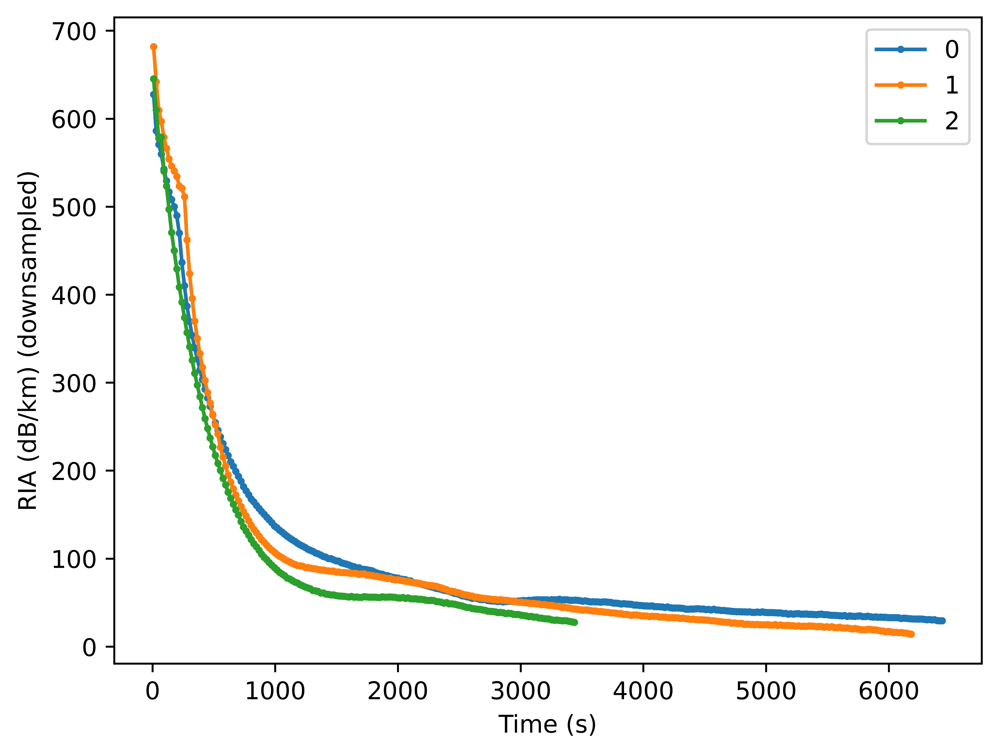

[-4.49530861e+02  3.37099261e+01  2.58994187e+02  4.73391713e-04]
[2.71121435e+02 1.01418862e+02 2.58547692e+02 4.84101041e-04]
[9.98886158e+01 8.33940833e+01 2.34817999e+02 6.11238700e-04]


/home/aulegoup/miniforge/envs/jupenv/lib/python3.12/site-packages/scipy/stats/_stats_mstats_common.py:182: RuntimeWarning: invalid value encountered in scalar divide
  slope = ssxym / ssxm
/home/aulegoup/miniforge/envs/jupenv/lib/python3.12/site-packages/scipy/stats/_stats_mstats_common.py:196: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
/home/aulegoup/miniforge/envs/jupenv/lib/python3.12/site-packages/scipy/stats/_stats_mstats_common.py:199: RuntimeWarning: invalid value encountered in scalar divide
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)


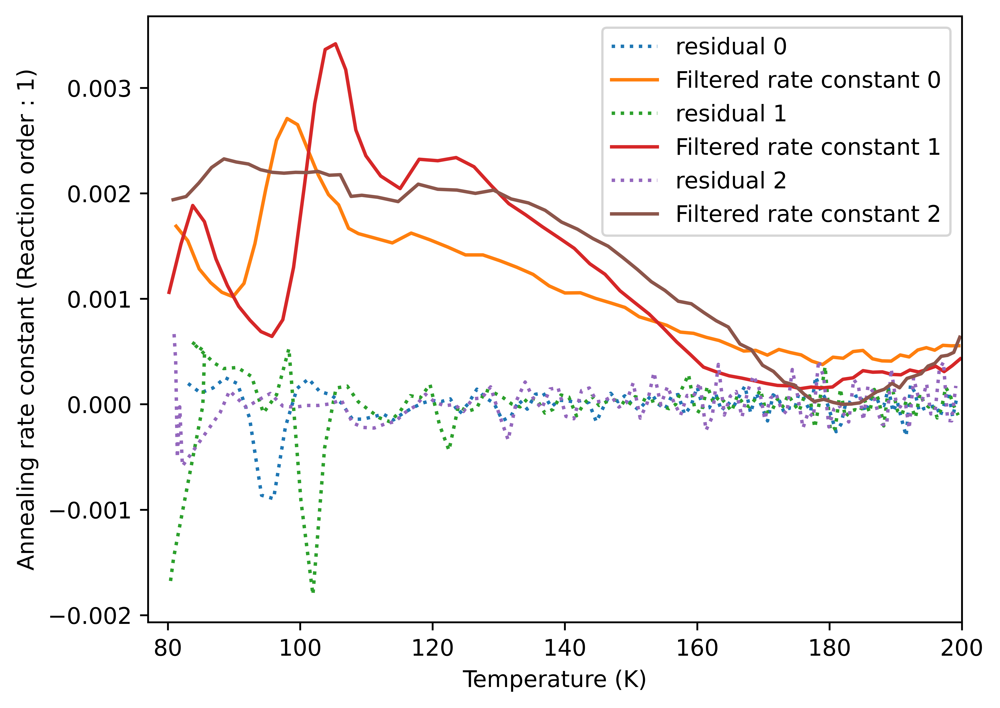

1
Time correction ratio for zeroing times : 1.0287 (no unit)


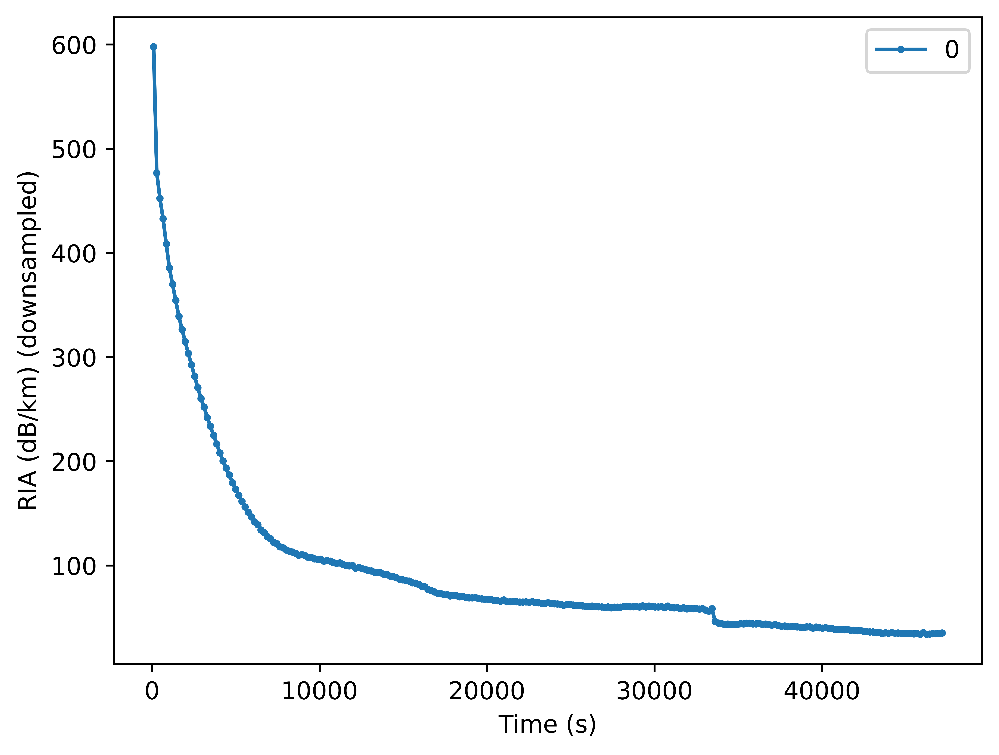

[3.36823565e+03 1.11692770e+02 3.14640868e+02 4.71388024e-05]


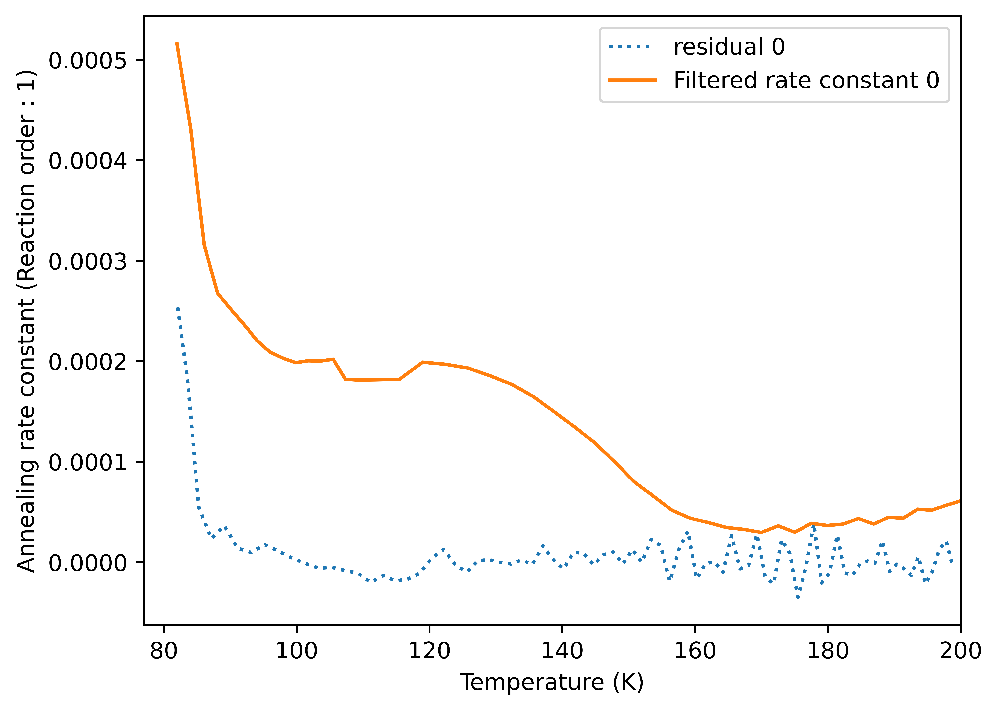

2
Time correction ratio for zeroing times : 1.0287 (no unit)


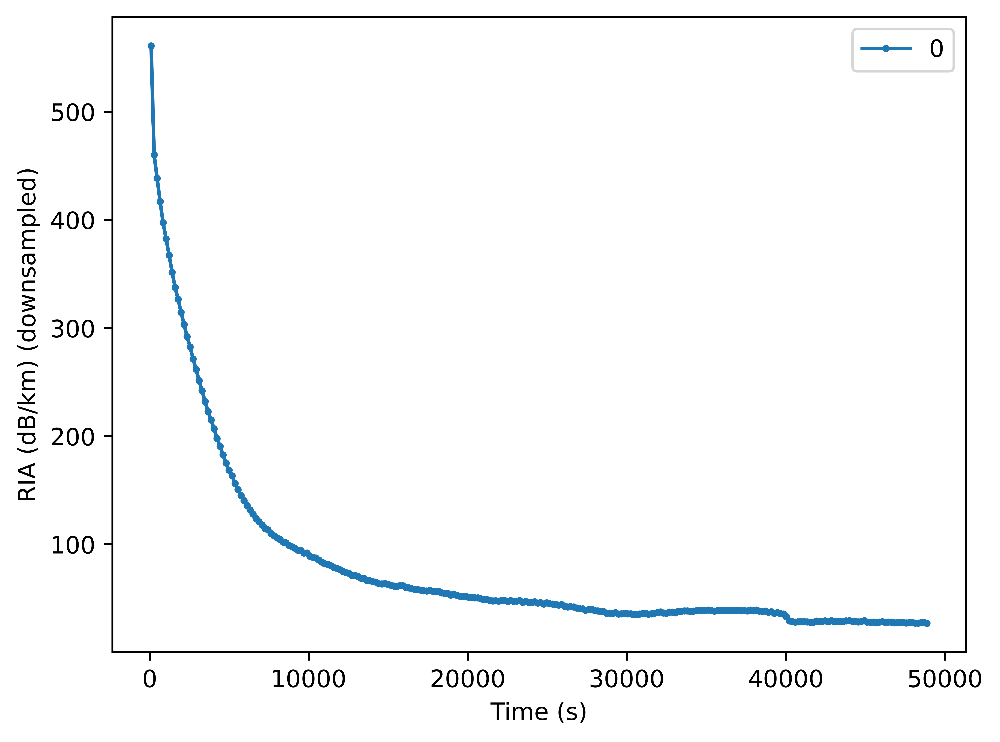

[-1.54255381e+04 -1.83568165e+02  3.13689203e+02  4.75590017e-05]


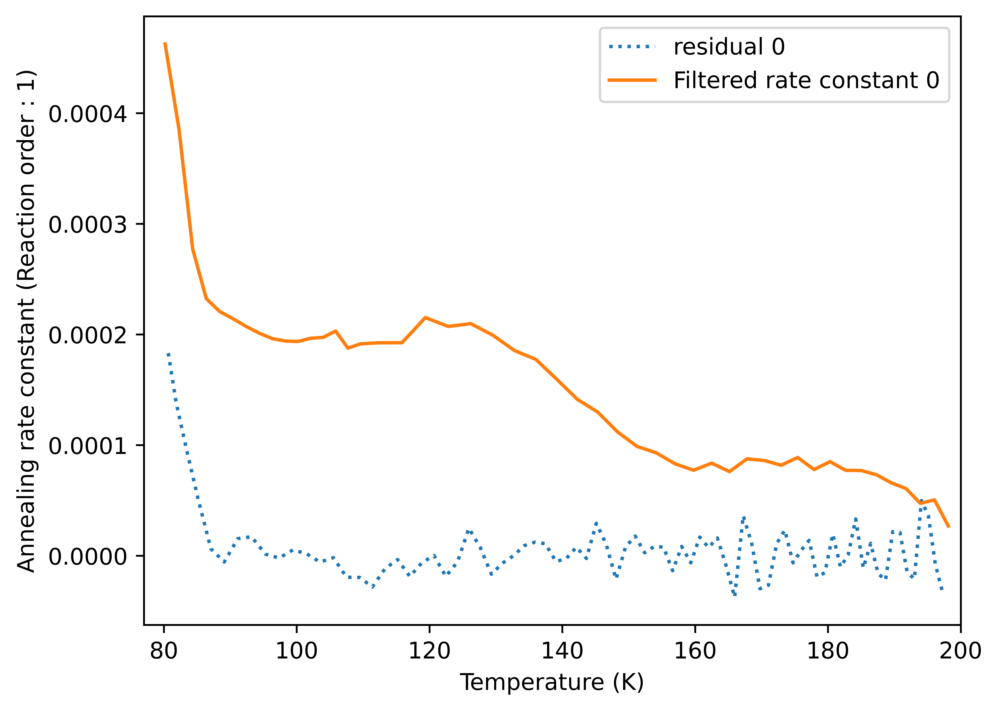

In [10]:
# fileid = 0
TA_RANGES_dic = {0:[(728,3500),(4438,7100),(7951,9432)],
                 1:[(649,21800)],
                 2:[(754,21800)]}

for fileid in range(3):
    print(fileid)
    RIA_avgrange = (1550-10,1550+10)
    ID_avgrange = ( next(x for x, val in enumerate(WL_nm) if val >= RIA_avgrange[0]),  next(x for x, val in enumerate(WL_nm) if val >= RIA_avgrange[1]) )
    i_start=0
    i_end=(len( DIC_fprop[fileid]["Id2LEVEL"]))
    mean_RIA = np.array([np.mean( ( DIC_fprop[fileid]["Id2LEVEL"][i_start][ID_avgrange[0]:ID_avgrange[1]+1]
                                  - DIC_fprop[fileid]["Id2LEVEL"][i][ID_avgrange[0]:ID_avgrange[1]+1]       ) / FILES[fileid]['samplelength'] * 1000) for i in range(i_start,i_end)])    
    TA_RANGES = TA_RANGES_dic[fileid]
    
    TIME = np.arange(len( DIC_fprop[fileid]["Id2LEVEL"])) * FILES[fileid]['sweepperiod'] /60 #min
    TimeCorrectionForZeroingTimes = (17640-840)/(7588-365) / FILES[fileid]['sweepperiod']
    print(f"Time correction ratio for zeroing times : {TimeCorrectionForZeroingTimes:.4f} (no unit)")
    TIME *= TimeCorrectionForZeroingTimes
    
    def TimeRangeFromSpecID(start,stop):
        return np.arange(start,stop) * (17640-840)/(7588-365) #seconds
    
    def TimeFromSpecID(IDtime):
        return IDtime * (17640-840)/(7588-365) #seconds
    
    def reducedata(X,Y,npointsinterp=9):
        assert len(X)==len(Y)
        X,Y=np.array(X),np.array(Y)
        X_f,Y_f=[],[]
        for i in range(0,len(Y),npointsinterp):
            upper=min(i+npointsinterp,len(Y))
            X_short,Y_short = X[i:upper],Y[i:upper]
            res = stats.linregress(X_short, Y_short)
            x = np.mean(X_short)
            y = res.intercept + res.slope*x
            X_f+=[x]
            Y_f+=[y]
        return np.array(X_f),np.array(Y_f)
    
    #Explanation of processing:
    ADDPROCESSING = True

    #I calculate the mean RIA around 1550nm in the range stated above, store it in ria (and store the corresponding time array)
    #I reduce ria data by the default reduction factor
    #I then plot this reduced data
    #The annealing rate constant is calculated as
    ReactionOrder=1
    #Tried fitting exponential to temperature profile
    #
    
    
    fig = plt.figure()
    fig.set_dpi(1000)
    
    ANNEALINGRATES=[]
    for i,id_range in enumerate(TA_RANGES[:]):
        ria, time = mean_RIA[np.arange(*id_range)] , TimeRangeFromSpecID(*id_range)-TimeFromSpecID(id_range[0])
        if True:
            time, ria = reducedata(time, ria)
            if fileid>0:
                time, ria = reducedata(time, ria)
            ria = smoothMS(ria,n=6,m=10)
        plt.plot(time,ria,marker='o',markersize=2,label=i)
        annealingratecst = - np.gradient(ria, time[1]-time[0]) / ria**ReactionOrder
        ANNEALINGRATES+=[(time,annealingratecst)]
    # plt.xlim(0,40)
    # print(TimetoTemp(0+TimeFromSpecID(728),fileid,mode="temp"))
    # print(TimetoTemp(40+TimeFromSpecID(728),fileid,mode="temp"))
    plt.xlabel("Time (s)")
    plt.ylabel("RIA (dB/km) (downsampled)")
    plt.legend()
    plt.show()
    
    def monoExp(x, x0, T0, T1, alpha):
        return (T0-T1) * np.exp(-alpha * (x-x0)) + T1
    
    fig = plt.figure()
    fig.set_dpi(1000)
    for i,(time,annealingratecst) in enumerate(ANNEALINGRATES):
        start = TA_RANGES[i][0]
        Temperatures = TimetoTemp(time + TimeFromSpecID(start),fileid,mode="temp")
        init_Temperatures,init_annealingratecst=Temperatures,annealingratecst
        if ADDPROCESSING:
            if True:
                params = ( time[0], Temperatures[0], 300, np.log( (Temperatures[0]-300)/(Temperatures[-1]-300) )/(time[-1]-time[0]) )
                params, cv = scipy.optimize.curve_fit(monoExp, time[:len(time)//2], Temperatures[:len(time)//2], params)
                print(params)
                # plt.scatter(time,Temperatures,s=2)
                # plt.plot(time, monoExp(time,*params))
                # plt.show()
                Temperatures=monoExp(time,*params)
            #we try to fit the Temperatures with an exponential curve
        
            Temperatures_sh,annealingratecst_sh = reducedata(Temperatures[Temperatures>110],annealingratecst[Temperatures>110],npointsinterp=2)
            Temperatures_sh,annealingratecst_sh = np.concatenate((Temperatures[Temperatures<=110],Temperatures_sh)),\
                                                np.concatenate((np.convolve(annealingratecst[Temperatures<=110], np.ones(3)/3, mode='same'),annealingratecst_sh))
            Temperatures_sh,annealingratecst_sh = Temperatures_sh,smoothMS(annealingratecst_sh,n=4,m=10)
            Temperatures_sh,annealingratecst_sh = Temperatures_sh,np.convolve(annealingratecst_sh, np.ones(4)/4, mode='same')
            Temperatures_sh,annealingratecst_sh = Temperatures_sh[(Temperatures_sh<200)*(Temperatures_sh>80)],annealingratecst_sh[(Temperatures_sh<200)*(Temperatures_sh>80)]
        
            init_Temperatures,init_annealingratecst = init_Temperatures[(init_Temperatures>Temperatures_sh[0])*(init_Temperatures<Temperatures_sh[-1])], \
                                                    init_annealingratecst[(init_Temperatures>Temperatures_sh[0])*(init_Temperatures<Temperatures_sh[-1])]
            interponinit_annealingratecst = np.interp(init_Temperatures, Temperatures_sh,annealingratecst_sh)
            
            plt.plot(init_Temperatures,(interponinit_annealingratecst-init_annealingratecst),linestyle='dotted',label=f"residual {i}")
        else:
            Temperatures_sh,annealingratecst_sh = init_Temperatures,init_annealingratecst
        
        # plt.plot(Temperatures)
        # plt.show()
        plt.plot(Temperatures_sh,annealingratecst_sh,label=f"Filtered rate constant {i}")
    plt.xlabel("Temperature (K)")
    plt.ylabel(f"Annealing rate constant (Reaction order : {ReactionOrder})")
    plt.xlim(77,200)
    # plt.ylim(-1e-5,1e-2)
    plt.legend()
    plt.show()

0
Time correction ratio for zeroing times : 1.0287 (no unit)
1
Time correction ratio for zeroing times : 1.0287 (no unit)


/home/aulegoup/miniforge/envs/jupenv/lib/python3.12/site-packages/scipy/stats/_stats_mstats_common.py:182: RuntimeWarning: invalid value encountered in scalar divide
  slope = ssxym / ssxm
/home/aulegoup/miniforge/envs/jupenv/lib/python3.12/site-packages/scipy/stats/_stats_mstats_common.py:196: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
/home/aulegoup/miniforge/envs/jupenv/lib/python3.12/site-packages/scipy/stats/_stats_mstats_common.py:199: RuntimeWarning: invalid value encountered in scalar divide
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)


2
Time correction ratio for zeroing times : 1.0287 (no unit)


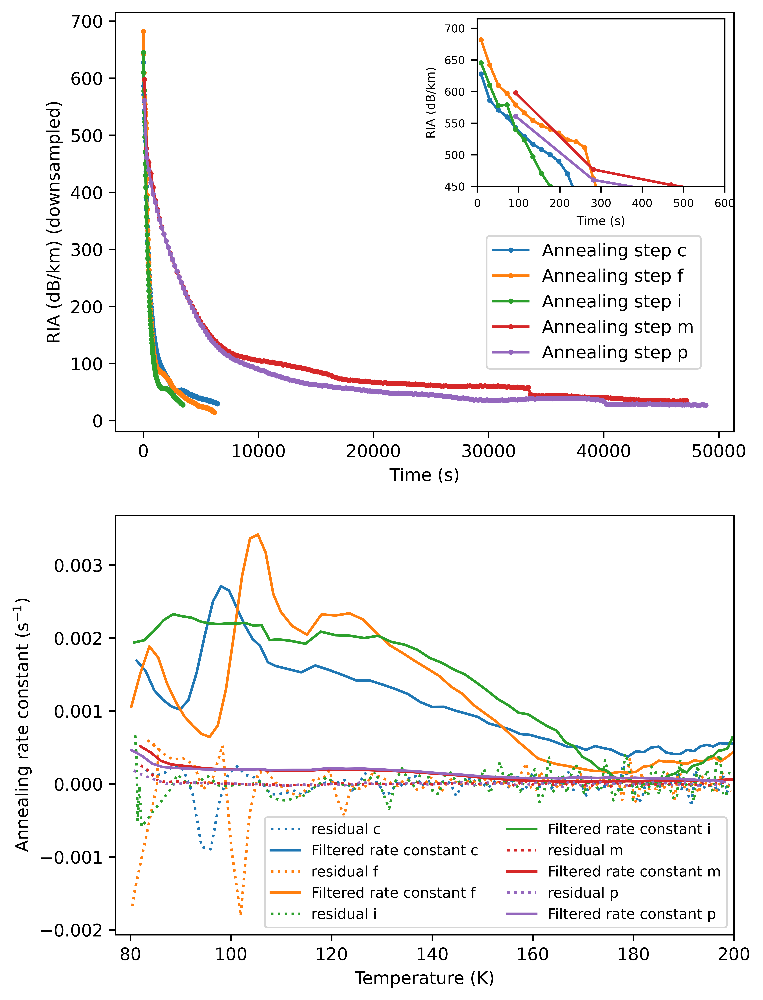

In [43]:
# fileid = 0
TA_RANGES_dic = {0:[(728,3500),(4438,7100),(7951,9432)],
                 1:[(649,21800)],
                 2:[(754,21800)]}
annealingsteps=['c','f','i','m','p']

fig, axs = plt.subplots(2, figsize=[6.4, 4.8*2], gridspec_kw={'height_ratios': [2, 2]})
subax = add_subplot_axes(axs[0],[0.585,0.585,0.4,0.4])
fig.set_dpi(1000)

COLORS=["tab:blue", "tab:orange", "tab:green", "tab:red", "tab:purple"]

for fileid in range(3):
    print(fileid)
    RIA_avgrange = (1550-10,1550+10)
    ID_avgrange = ( next(x for x, val in enumerate(WL_nm) if val >= RIA_avgrange[0]),  next(x for x, val in enumerate(WL_nm) if val >= RIA_avgrange[1]) )
    i_start=0
    i_end=(len( DIC_fprop[fileid]["Id2LEVEL"]))
    mean_RIA = np.array([np.mean( ( DIC_fprop[fileid]["Id2LEVEL"][i_start][ID_avgrange[0]:ID_avgrange[1]+1]
                                  - DIC_fprop[fileid]["Id2LEVEL"][i][ID_avgrange[0]:ID_avgrange[1]+1]       ) / FILES[fileid]['samplelength'] * 1000) for i in range(i_start,i_end)])    
    TA_RANGES = TA_RANGES_dic[fileid]
    
    TIME = np.arange(len( DIC_fprop[fileid]["Id2LEVEL"])) * FILES[fileid]['sweepperiod'] /60 #min
    TimeCorrectionForZeroingTimes = (17640-840)/(7588-365) / FILES[fileid]['sweepperiod']
    print(f"Time correction ratio for zeroing times : {TimeCorrectionForZeroingTimes:.4f} (no unit)")
    TIME *= TimeCorrectionForZeroingTimes
    
    def TimeRangeFromSpecID(start,stop):
        return np.arange(start,stop) * (17640-840)/(7588-365) #seconds
    
    def TimeFromSpecID(IDtime):
        return IDtime * (17640-840)/(7588-365) #seconds
    
    def reducedata(X,Y,npointsinterp=9):
        assert len(X)==len(Y)
        X,Y=np.array(X),np.array(Y)
        X_f,Y_f=[],[]
        for i in range(0,len(Y),npointsinterp):
            upper=min(i+npointsinterp,len(Y))
            X_short,Y_short = X[i:upper],Y[i:upper]
            res = stats.linregress(X_short, Y_short)
            x = np.mean(X_short)
            y = res.intercept + res.slope*x
            X_f+=[x]
            Y_f+=[y]
        return np.array(X_f),np.array(Y_f)
    
    #Explanation of processing:
    ADDPROCESSING = True

    #I calculate the mean RIA around 1550nm in the range stated above, store it in ria (and store the corresponding time array)
    #I reduce ria data by the default reduction factor
    #I then plot this reduced data
    #The annealing rate constant is calculated as
    ReactionOrder=1
    #Tried fitting exponential to temperature profile
    #
    
    
    ANNEALINGRATES=[]
    for i,id_range in enumerate(TA_RANGES[:]):
        ria, time = mean_RIA[np.arange(*id_range)] , TimeRangeFromSpecID(*id_range)-TimeFromSpecID(id_range[0])
        if True:
            time, ria = reducedata(time, ria)
            if fileid>0:
                time, ria = reducedata(time, ria)
            ria = smoothMS(ria,n=6,m=10)
        colcount=int(i+np.sum([len(TA_RANGES_dic[fi]) for fi in range(fileid)]))
        axs[0].plot(time,ria,marker='o',markersize=2,color=COLORS[colcount],label="Annealing step "+str(annealingsteps[int(i+np.sum([len(TA_RANGES_dic[fi]) for fi in range(fileid)]))]))
        subax.plot(time,ria,marker='o',markersize=2,color=COLORS[colcount])#,label="Annealing step "+str(annealingsteps[int(i+np.sum([len(TA_RANGES_dic[fi]) for fi in range(fileid)]))]))
        annealingratecst = - np.gradient(ria, time[1]-time[0]) / ria**1
        print("WARNING : here its ria**1")
        ANNEALINGRATES+=[(time,annealingratecst)]
    # plt.xlim(0,40)
    # print(TimetoTemp(0+TimeFromSpecID(728),fileid,mode="temp"))
    # print(TimetoTemp(40+TimeFromSpecID(728),fileid,mode="temp"))
    axs[0].set_xlabel("Time (s)")
    axs[0].set_ylabel("RIA (dB/km) (downsampled)")
    subax.set_xlabel("Time (s)",fontsize="x-small")
    subax.set_ylabel("RIA (dB/km)",fontsize="x-small")
    subax.set_xlim(0,600)
    subax.set_ylim(bottom=450)

      
    def monoExp(x, x0, T0, T1, alpha):
        return (T0-T1) * np.exp(-alpha * (x-x0)) + T1
    
    for i,(time,annealingratecst) in enumerate(ANNEALINGRATES):
        start = TA_RANGES[i][0]
        Temperatures = TimetoTemp(time + TimeFromSpecID(start),fileid,mode="temp")
        init_Temperatures,init_annealingratecst=Temperatures,annealingratecst
        colcount=int(i+np.sum([len(TA_RANGES_dic[fi]) for fi in range(fileid)]))
        if ADDPROCESSING:
            if True:
                params = ( time[0], Temperatures[0], 300, np.log( (Temperatures[0]-300)/(Temperatures[-1]-300) )/(time[-1]-time[0]) )
                params, cv = scipy.optimize.curve_fit(monoExp, time[:len(time)//2], Temperatures[:len(time)//2], params)
                # plt.scatter(time,Temperatures,s=2)
                # plt.plot(time, monoExp(time,*params))
                # plt.show()
                Temperatures=monoExp(time,*params)
            #we try to fit the Temperatures with an exponential curve
        
            Temperatures_sh,annealingratecst_sh = reducedata(Temperatures[Temperatures>110],annealingratecst[Temperatures>110],npointsinterp=2)
            Temperatures_sh,annealingratecst_sh = np.concatenate((Temperatures[Temperatures<=110],Temperatures_sh)),\
                                                np.concatenate((np.convolve(annealingratecst[Temperatures<=110], np.ones(3)/3, mode='same'),annealingratecst_sh))
            Temperatures_sh,annealingratecst_sh = Temperatures_sh,smoothMS(annealingratecst_sh,n=4,m=10)
            Temperatures_sh,annealingratecst_sh = Temperatures_sh,np.convolve(annealingratecst_sh, np.ones(4)/4, mode='same')
            Temperatures_sh,annealingratecst_sh = Temperatures_sh[(Temperatures_sh<200)*(Temperatures_sh>80)],annealingratecst_sh[(Temperatures_sh<200)*(Temperatures_sh>80)]
        
            init_Temperatures,init_annealingratecst = init_Temperatures[(init_Temperatures>Temperatures_sh[0])*(init_Temperatures<Temperatures_sh[-1])], \
                                                    init_annealingratecst[(init_Temperatures>Temperatures_sh[0])*(init_Temperatures<Temperatures_sh[-1])]
            interponinit_annealingratecst = np.interp(init_Temperatures, Temperatures_sh,annealingratecst_sh)
            
            axs[1].plot(init_Temperatures,(interponinit_annealingratecst-init_annealingratecst),linestyle='dotted',color=COLORS[colcount],label=f"residual {annealingsteps[int(i+np.sum([len(TA_RANGES_dic[fi]) for fi in range(fileid)]))]}")
        else:
            Temperatures_sh,annealingratecst_sh = init_Temperatures,init_annealingratecst
        
        # plt.plot(Temperatures)
        # plt.show()
        axs[1].plot(Temperatures_sh,annealingratecst_sh,color=COLORS[colcount],label=f"Filtered rate constant {annealingsteps[int(i+np.sum([len(TA_RANGES_dic[fi]) for fi in range(fileid)]))]}")
    axs[1].set_xlabel("Temperature (K)")
    axs[1].set_ylabel("Annealing rate constant (s$^{-1}$)")
    axs[1].set_xlim(77,200)
    # plt.ylim(-1e-5,1e-2)
axs[0].legend(loc=(0.6,0.15))
axs[1].legend(ncol=2,fontsize="small")
plt.savefig("AnnealRateasofT.pdf",bbox_inches="tight")
plt.show()

In [ ]:
# fileid = 0
TA_RANGES_dic = {0:[(728,3500),(4438,7100),(7951,9432)],
                 1:[(649,21800)],
                 2:[(754,21800)]}
annealingsteps=['c','f','i','m','p']

fig, axs = plt.subplots(2, figsize=[6.4, 4.8*2], gridspec_kw={'height_ratios': [2, 2]})
fig.set_dpi(1000)

for fileid in range(3):
    print(fileid)
    RIA_avgrange = (1550-10,1550+10)
    ID_avgrange = ( next(x for x, val in enumerate(WL_nm) if val >= RIA_avgrange[0]),  next(x for x, val in enumerate(WL_nm) if val >= RIA_avgrange[1]) )
    i_start=0
    i_end=(len( DIC_fprop[fileid]["Id2LEVEL"]))
    mean_RIA = np.array([np.mean( ( DIC_fprop[fileid]["Id2LEVEL"][i_start][ID_avgrange[0]:ID_avgrange[1]+1]
                                  - DIC_fprop[fileid]["Id2LEVEL"][i][ID_avgrange[0]:ID_avgrange[1]+1]       ) / FILES[fileid]['samplelength'] * 1000) for i in range(i_start,i_end)])    
    TA_RANGES = TA_RANGES_dic[fileid]
    
    TIME = np.arange(len( DIC_fprop[fileid]["Id2LEVEL"])) * FILES[fileid]['sweepperiod'] /60 #min
    TimeCorrectionForZeroingTimes = (17640-840)/(7588-365) / FILES[fileid]['sweepperiod']
    print(f"Time correction ratio for zeroing times : {TimeCorrectionForZeroingTimes:.4f} (no unit)")
    TIME *= TimeCorrectionForZeroingTimes
    
    def TimeRangeFromSpecID(start,stop):
        return np.arange(start,stop) * (17640-840)/(7588-365) #seconds
    
    def TimeFromSpecID(IDtime):
        return IDtime * (17640-840)/(7588-365) #seconds
    
    def reducedata(X,Y,npointsinterp=9):
        assert len(X)==len(Y)
        X,Y=np.array(X),np.array(Y)
        X_f,Y_f=[],[]
        for i in range(0,len(Y),npointsinterp):
            upper=min(i+npointsinterp,len(Y))
            X_short,Y_short = X[i:upper],Y[i:upper]
            res = stats.linregress(X_short, Y_short)
            x = np.mean(X_short)
            y = res.intercept + res.slope*x
            X_f+=[x]
            Y_f+=[y]
        return np.array(X_f),np.array(Y_f)
    
    #Explanation of processing:
    ADDPROCESSING = True

    #I calculate the mean RIA around 1550nm in the range stated above, store it in ria (and store the corresponding time array)
    #I reduce ria data by the default reduction factor
    #I then plot this reduced data
    #The annealing rate constant is calculated as
    ReactionOrder=1
    #Tried fitting exponential to temperature profile
    #
    
    
    ANNEALINGRATES=[]
    for i,id_range in enumerate(TA_RANGES[:]):
        ria, time = mean_RIA[np.arange(*id_range)] , TimeRangeFromSpecID(*id_range)-TimeFromSpecID(id_range[0])
        if True:
            time, ria = reducedata(time, ria)
            if fileid>0:
                time, ria = reducedata(time, ria)
            ria = smoothMS(ria,n=6,m=10)
        if fileid>0:
            axs[0].plot(time,ria,marker='o',markersize=2,label="Annealing step "+str(annealingsteps[int(i+np.sum([len(TA_RANGES_dic[fi]) for fi in range(fileid)]))]))
        annealingratecst = - np.gradient(ria, time[1]-time[0]) / ria**0
        ANNEALINGRATES+=[(time,annealingratecst)]
    # plt.xlim(0,40)
    # print(TimetoTemp(0+TimeFromSpecID(728),fileid,mode="temp"))
    # print(TimetoTemp(40+TimeFromSpecID(728),fileid,mode="temp"))
    axs[0].set_xlabel("Time (s)")
    axs[0].set_ylabel("RIA (dB/km) (downsampled)")
    
    def monoExp(x, x0, T0, T1, alpha):
        return (T0-T1) * np.exp(-alpha * (x-x0)) + T1
    
    for i,(time,annealingratecst) in enumerate(ANNEALINGRATES):
        start = TA_RANGES[i][0]
        Temperatures = TimetoTemp(time + TimeFromSpecID(start),fileid,mode="temp")
        init_Temperatures,init_annealingratecst=Temperatures,annealingratecst
        if ADDPROCESSING:
            if True:
                params = ( time[0], Temperatures[0], 300, np.log( (Temperatures[0]-300)/(Temperatures[-1]-300) )/(time[-1]-time[0]) )
                params, cv = scipy.optimize.curve_fit(monoExp, time[:len(time)//2], Temperatures[:len(time)//2], params)
                # plt.scatter(time,Temperatures,s=2)
                # plt.plot(time, monoExp(time,*params))
                # plt.show()
                Temperatures=monoExp(time,*params)
            #we try to fit the Temperatures with an exponential curve
        
            Temperatures_sh,annealingratecst_sh = reducedata(Temperatures[Temperatures>110],annealingratecst[Temperatures>110],npointsinterp=2)
            Temperatures_sh,annealingratecst_sh = np.concatenate((Temperatures[Temperatures<=110],Temperatures_sh)),\
                                                np.concatenate((np.convolve(annealingratecst[Temperatures<=110], np.ones(3)/3, mode='same'),annealingratecst_sh))
            Temperatures_sh,annealingratecst_sh = Temperatures_sh,smoothMS(annealingratecst_sh,n=4,m=10)
            Temperatures_sh,annealingratecst_sh = Temperatures_sh,np.convolve(annealingratecst_sh, np.ones(4)/4, mode='same')
            Temperatures_sh,annealingratecst_sh = Temperatures_sh[(Temperatures_sh<200)*(Temperatures_sh>80)],annealingratecst_sh[(Temperatures_sh<200)*(Temperatures_sh>80)]
        
            init_Temperatures,init_annealingratecst = init_Temperatures[(init_Temperatures>Temperatures_sh[0])*(init_Temperatures<Temperatures_sh[-1])], \
                                                    init_annealingratecst[(init_Temperatures>Temperatures_sh[0])*(init_Temperatures<Temperatures_sh[-1])]
            interponinit_annealingratecst = np.interp(init_Temperatures, Temperatures_sh,annealingratecst_sh)
            
            axs[1].plot(init_Temperatures,(interponinit_annealingratecst-init_annealingratecst),linestyle='dotted',label=f"residual {annealingsteps[int(i+np.sum([len(TA_RANGES_dic[fi]) for fi in range(fileid)]))]}")
        else:
            Temperatures_sh,annealingratecst_sh = init_Temperatures,init_annealingratecst
        
        # plt.plot(Temperatures)
        # plt.show()
        axs[1].plot(Temperatures_sh,annealingratecst_sh,label=f"Filtered rate constant {annealingsteps[int(i+np.sum([len(TA_RANGES_dic[fi]) for fi in range(fileid)]))]}")
    axs[1].set_xlabel("Temperature (K)")
    axs[1].set_ylabel("Annealing rate constant (s$^{-1}$)")
    axs[1].set_xlim(77,200)
    # plt.ylim(-1e-5,1e-2)
axs[0].legend()
axs[1].legend(ncol=2,fontsize="small")
plt.savefig("AnnealRateasofTonlymp.pdf")
plt.show()

# Annealing rate as a function of attenuation level

<>:61: SyntaxWarning: invalid escape sequence '\m'
<>:61: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_2015/2677102322.py:61: SyntaxWarning: invalid escape sequence '\m'
  axs[0].semilogy(np.linspace(*xlim),0.473*np.exp(0.009 * (np.linspace(*xlim)-831.238)),label="5uW 1550nm OA exponential fit at $5\mu W$ from chapter 3.3",linestyle="dashed")


0
Time correction ratio for zeroing times : 1.0287 (no unit)
1
Time correction ratio for zeroing times : 1.0287 (no unit)


/home/aulegoup/miniforge/envs/jupenv/lib/python3.12/site-packages/scipy/stats/_stats_mstats_common.py:182: RuntimeWarning: invalid value encountered in scalar divide
  slope = ssxym / ssxm
/home/aulegoup/miniforge/envs/jupenv/lib/python3.12/site-packages/scipy/stats/_stats_mstats_common.py:196: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
/home/aulegoup/miniforge/envs/jupenv/lib/python3.12/site-packages/scipy/stats/_stats_mstats_common.py:199: RuntimeWarning: invalid value encountered in scalar divide
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)


2
Time correction ratio for zeroing times : 1.0287 (no unit)


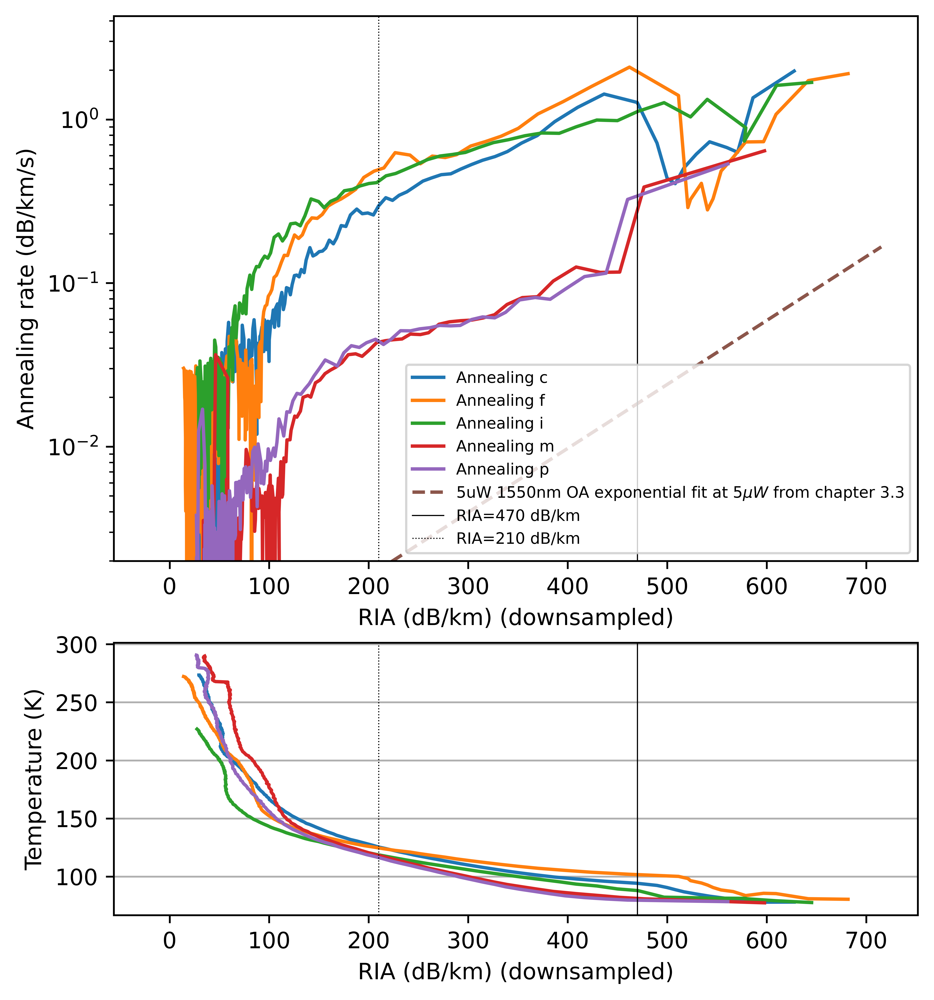

In [16]:
# fileid = 0
fig, axs = plt.subplots(2, figsize=[6.4, 4.8*1.5], gridspec_kw={'height_ratios': [2, 1]})
fig.set_dpi(1000)
TA_RANGES_dic = {0:[(728,3500),(4438,7100),(7951,9432)],
                 1:[(649,21800)],
                 2:[(754,21800)]}
for fileid in range(3):
    print(fileid)
    RIA_avgrange = (1550-10,1550+10)
    ID_avgrange = ( next(x for x, val in enumerate(WL_nm) if val >= RIA_avgrange[0]),  next(x for x, val in enumerate(WL_nm) if val >= RIA_avgrange[1]) )
    i_start=0
    i_end=(len( DIC_fprop[fileid]["Id2LEVEL"]))
    mean_RIA = np.array([np.mean( ( DIC_fprop[fileid]["Id2LEVEL"][i_start][ID_avgrange[0]:ID_avgrange[1]+1]
                                  - DIC_fprop[fileid]["Id2LEVEL"][i][ID_avgrange[0]:ID_avgrange[1]+1]       ) / FILES[fileid]['samplelength'] * 1000) for i in range(i_start,i_end)])    
    TA_RANGES = TA_RANGES_dic[fileid]
    
    TIME = np.arange(len( DIC_fprop[fileid]["Id2LEVEL"])) * FILES[fileid]['sweepperiod'] /60 #min
    TimeCorrectionForZeroingTimes = (17640-840)/(7588-365) / FILES[fileid]['sweepperiod']
    print(f"Time correction ratio for zeroing times : {TimeCorrectionForZeroingTimes:.4f} (no unit)")
    TIME *= TimeCorrectionForZeroingTimes
    
    def TimeRangeFromSpecID(start,stop):
        return np.arange(start,stop) * (17640-840)/(7588-365) #seconds
    
    def TimeFromSpecID(IDtime):
        return IDtime * (17640-840)/(7588-365) #seconds
    
    def reducedata(X,Y,npointsinterp=9):
        assert len(X)==len(Y)
        X,Y=np.array(X),np.array(Y)
        X_f,Y_f=[],[]
        for i in range(0,len(Y),npointsinterp):
            upper=min(i+npointsinterp,len(Y))
            X_short,Y_short = X[i:upper],Y[i:upper]
            res = stats.linregress(X_short, Y_short)
            x = np.mean(X_short)
            y = res.intercept + res.slope*x
            X_f+=[x]
            Y_f+=[y]
        return np.array(X_f),np.array(Y_f)
        
    
    RIA=[]
    ANNEALINGRATES=[]
    for i,id_range in enumerate(TA_RANGES[:]):
        ria, time = mean_RIA[np.arange(*id_range)] , TimeRangeFromSpecID(*id_range)-TimeFromSpecID(id_range[0])
        if True:
            time, ria = reducedata(time, ria)
            if fileid>0:
                time, ria = reducedata(time, ria)
            ria = smoothMS(ria,n=6,m=10)
        annealingrate = - np.gradient(ria, time)
        RIA+=[(time,ria)]
        ANNEALINGRATES+=[(time,annealingrate)]

    for i,id_range in enumerate(TA_RANGES[:]):
        axs[0].semilogy(RIA[i][1],ANNEALINGRATES[i][1],label=f"Annealing {annealingsteps[int(i+np.sum([len(TA_RANGES_dic[fi]) for fi in range(fileid)]))]}")
        axs[1].plot(RIA[i][1],TimetoTemp(RIA[i][0]+TimeFromSpecID(id_range[0]),fileid,mode="temp"),label=f"Annealing ")

xlim=axs[0].get_xlim()
axs[0].semilogy(np.linspace(*xlim),0.473*np.exp(0.009 * (np.linspace(*xlim)-831.238)),label="5uW 1550nm OA exponential fit at $5\mu W$ from chapter 3.3",linestyle="dashed")
xcursor=470
axs[0].axvline(xcursor,linewidth=0.5,color='k',label=f"RIA={xcursor} dB/km")
axs[1].axvline(xcursor,linewidth=0.5,color='k')
xcursor=210
axs[0].axvline(xcursor,linewidth=0.5,color='k',label=f"RIA={xcursor} dB/km",linestyle="dotted")
axs[1].axvline(xcursor,linewidth=0.5,color='k',linestyle="dotted")

axs[0].set_xlabel("RIA (dB/km) (downsampled)")
axs[0].set_ylabel("Annealing rate (dB/km/s)")
axs[0].set_ylim(bottom=2e-3)
axs[0].legend(fontsize="x-small")

axs[1].set_xlabel("RIA (dB/km) (downsampled)")
axs[1].set_ylabel("Temperature (K)")
axs[1].set_xlim(axs[0].get_xlim())
axs[1].grid(axis='y')
# axs[1].legend()
plt.savefig("AnnealRateasofRIA.pdf")
# plt.show()

